In [1]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import re
import numpy as np
import glob
from scipy import sparse
from copy import deepcopy
import csv
import itertools
import warnings
import sys
import scanpy as sc
from collections import Counter
import phenograph
#from gtfparse import read_gtf

In [2]:
from matplotlib.cm import get_cmap
cols_use = get_cmap('tab10').colors

In [23]:
# set scanpy settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor='white')
sc.settings.figdir = figure_dir


scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.2.1 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


In [3]:
# read in raw data
data_file = '/Users/roses3/Dropbox/lung_tumor/sr/data/htan/merged/adata/ad_merged_qcFiltered_noAmbCB.h5ad'
adata = sc.read_h5ad(data_file)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [10]:
adata

AnnData object with n_obs × n_vars = 123768 × 25944
    obs: 'sample_name'

In [11]:
# set raw layer
adata.raw = adata

# Data preprocessing

In [12]:
# set histology information and filter for only LUAD samples
sample_tracker = pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/sample_lists/HTA.treg_atlas.trackerParsed_20210826.csv")
additional_obs = adata.obs.merge(sample_tracker, left_on = 'sample_name', right_on = 'sample_name.file', how = 'left')
adata.obs['histology'] = additional_obs['histology'].values
adata.obs['Procedure_Type'] = additional_obs['Procedure Type'].values

In [14]:
# filter for only LUAD samples
## changing to filter out LX108_2_re
adata_luad = adata[(adata.obs['sample_name'] != 'LX108_2_re') & (adata.obs['histology'] == "LUAD"),:].copy()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [15]:
adata_luad

AnnData object with n_obs × n_vars = 84909 × 25944
    obs: 'sample_name', 'histology', 'Procedure_Type'

In [76]:
adata_luad.obs_names_make_unique()

#### create sample number table

In [18]:
# create a conversion between patient ID and number and write out for use
# sample_table = pd.DataFrame({'sample_name': adata_luad.obs['sample_name'].unique(),
#               'sample_number': np.arange(1,27).astype(str)})
# sample_table.to_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/merged/patient_id_number_conversion.csv")

# read in this table that was previously created as identified above
sample_table = pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/merged/patient_id_number_conversion.csv")
sample_table = sample_table[['sample_name', 'sample_number']]

In [20]:
# load in ribosomal protein list
ribo_genes = pd.read_csv("/Users/roses3/Dropbox/reference_genomes/Homo_sapiens/annotations/hsa_riboProteins.symbol.txt",
                        header = None)
# remove mito ribo genes
ribo_genes_f = ribo_genes[~ribo_genes[0].str.contains("^M")]

In [21]:
adata_luad.var['ribo'] = adata_luad.var_names.isin(ribo_genes_f[0])
adata_luad.var['mt'] = adata_luad.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'

sc.pp.calculate_qc_metrics(adata_luad, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)


In [22]:
adata_luad.obs['pct_counts_ribo'].describe()

count    84909.000000
mean        27.319931
std         11.507520
min          0.000000
25%         20.000000
50%         27.338356
75%         35.008698
max         70.634232
Name: pct_counts_ribo, dtype: float64

In [23]:
adata_luad.obs['pct_counts_mt'].describe()

count    84909.000000
mean         6.287686
std          4.017755
min          0.000000
25%          3.212851
50%          5.432781
75%          8.506739
max         20.000000
Name: pct_counts_mt, dtype: float64

## feature selection

In [28]:
# import gtf file
gtf = read_gtf("/Users/roses3/Dropbox/reference_genomes/Homo_sapiens/ensembl/ensembl_85/Homo_sapiens.GRCh38.85.gtf.gz")

INFO:root:Extracted GTF attributes: ['gene_id', 'gene_version', 'gene_name', 'gene_source', 'gene_biotype', 'havana_gene', 'havana_gene_version', 'transcript_id', 'transcript_version', 'transcript_name', 'transcript_source', 'transcript_biotype', 'havana_transcript', 'havana_transcript_version', 'tag', 'transcript_support_level', 'exon_number', 'exon_id', 'exon_version', 'ccds_id', 'protein_id', 'protein_version']


In [29]:
gene_tsl = gtf[gtf['feature'] != 'gene'].groupby('gene_name').agg({'transcript_support_level': 'min'})

In [30]:
# remove genes that have transcript support level 4 or 5 (not that well annotated)
low_tsl_genes = gene_tsl[gene_tsl['transcript_support_level'].isin(['4','5'])]

In [31]:
# write out low tsl genes for ease of use later
low_tsl_genes.to_csv("/Users/roses3/Dropbox/reference_genomes/Homo_sapiens/ensembl/ensembl_85/tsl45_genes.csv")

In [32]:
# load low transcript support genes defined from ensembl gtf
low_tsl_genes = pd.read_csv("/Users/roses3/Dropbox/reference_genomes/Homo_sapiens/ensembl/ensembl_85/tsl45_genes.csv")
# filter out genes I want to keep from the low tsl genes
low_tsl_genes = low_tsl_genes[low_tsl_genes['gene_name'] != 'IFNA1']

# assign genes that have low cell counts
low_cell_counts_genes = adata_luad.var[adata_luad.var['n_cells_by_counts'] < 10].index

# assign bad genes to remove
bad_genes = adata.var_names.str.contains(
    "^MT-|^MTMR|^MTND|NEAT1|TMSB4X|TMSB10|^RPS|^RPL|^MRP|^FAU$|UBA52|MALAT|^TRAV|TRBD1|HBA[12]|^IG[HKL]|RP[1-9]+\-|^MTRNR") | \
adata_luad.var_names.isin(low_tsl_genes['gene_name']) | \
adata_luad.var_names.isin(low_cell_counts_genes)


In [33]:
bad_genes.sum()

7579

In [34]:
# genes retained
(bad_genes == False).sum()

18365

In [35]:
# get highly variable genes before normalization and without low cell count or genes to be removed in clustering
hvg = sc.pp.highly_variable_genes(adata_luad[:,~bad_genes], 
                           n_top_genes = 5000, 
                           flavor = 'seurat_v3', inplace = False)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


In [36]:
# now set highly variable genes in the var
adata_luad.var['highly_variable'] = adata_luad.var_names.isin(hvg[hvg['highly_variable'] == True].index.values)

In [37]:
# normalize by library size
sc.pp.normalize_total(adata_luad, target_sum=1e4)
sc.pp.log1p(adata_luad)


normalizing counts per cell
    finished (0:00:02)


## Dimensionality reduction and visualization

In [39]:
sc.tl.pca(adata_luad, svd_solver='arpack', n_comps = 100, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:17)


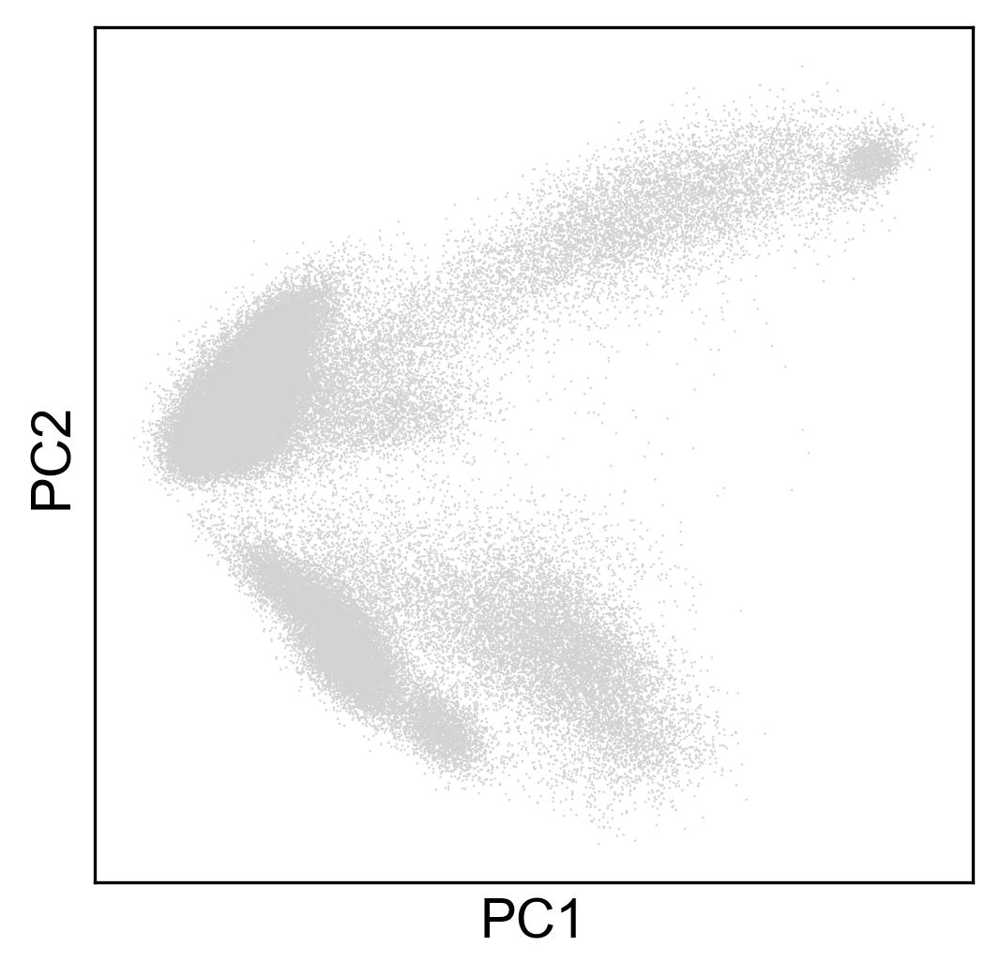

/Users/roses3/opt/miniconda3/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/roses3/opt/miniconda3/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:203: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


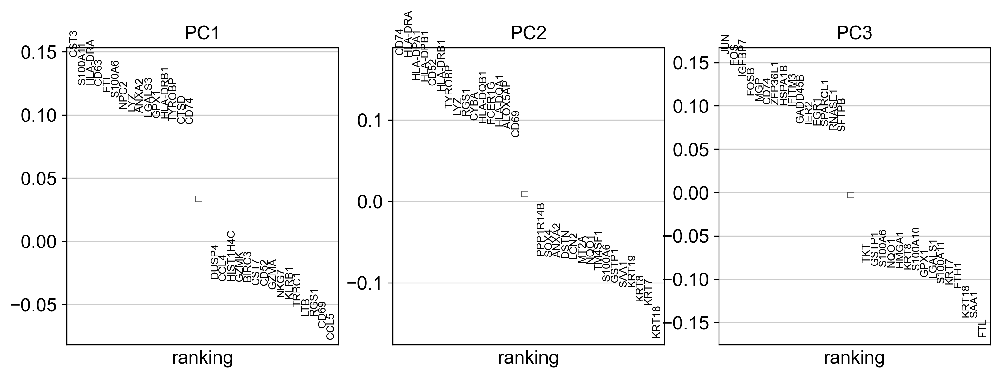

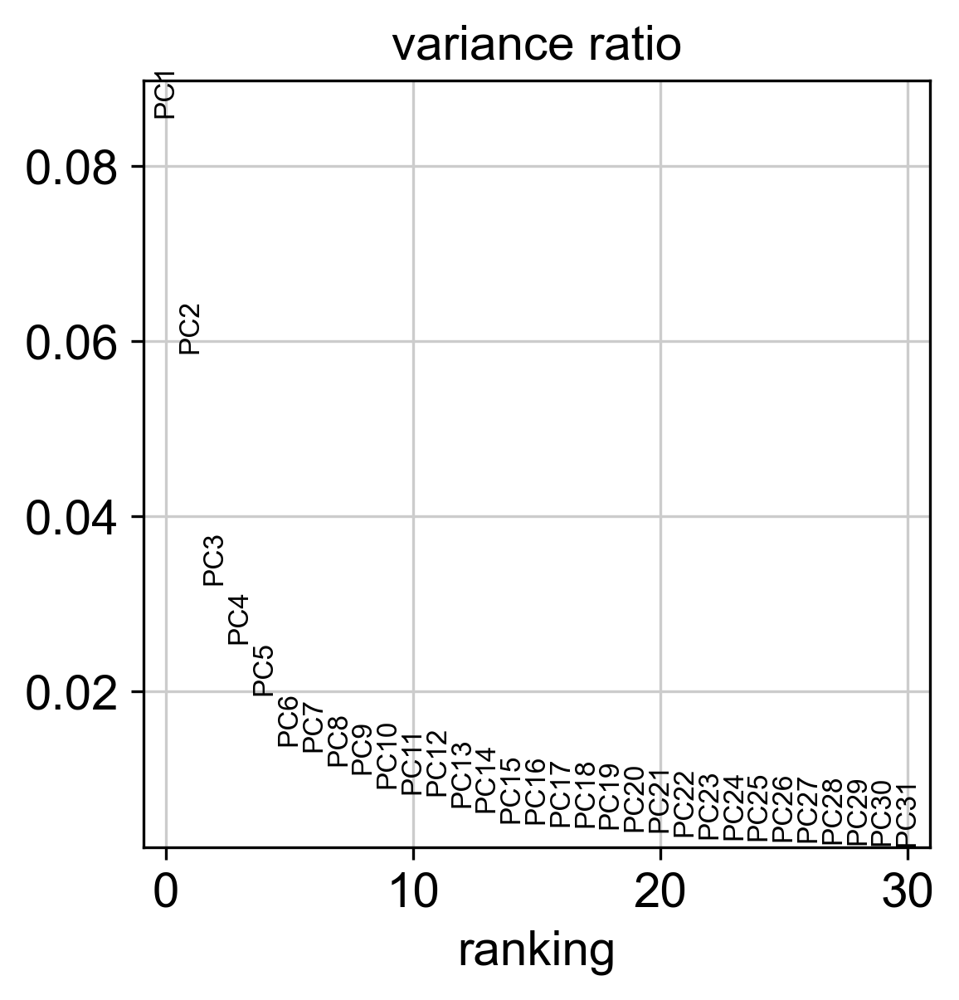

In [41]:
sc.pl.pca_overview(adata_luad)

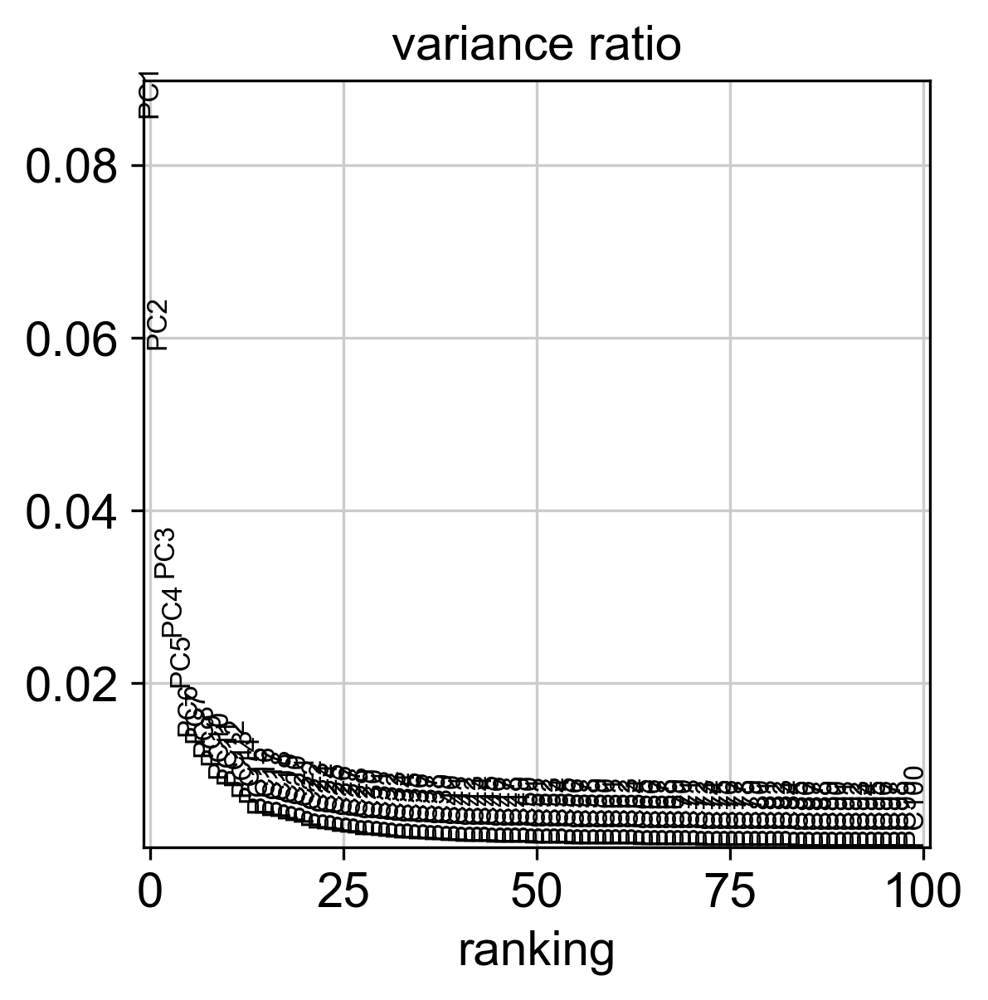

In [42]:
sc.pl.pca_variance_ratio(adata_luad, n_pcs = 100, log = False)

<AxesSubplot:ylabel='% variance explained'>

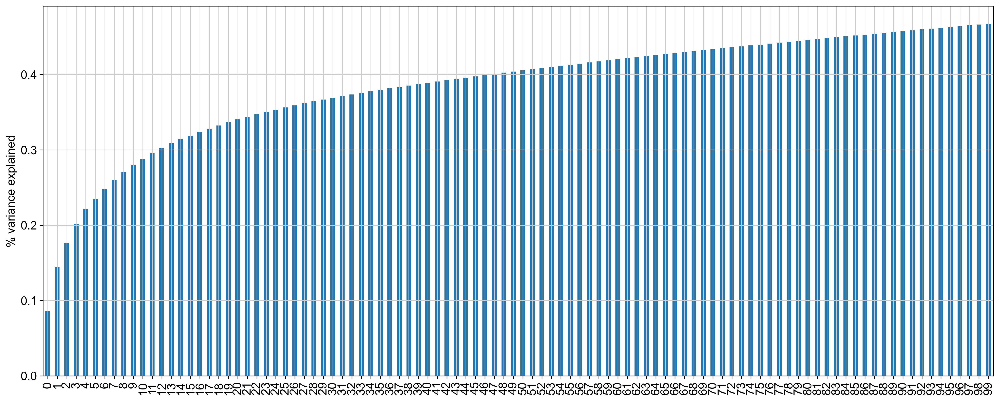

In [43]:
#np.cumsum(np.array(adata_scran.uns['pca']['variance_ratio']))
pd.Series(np.cumsum(np.array(adata_luad.uns['pca']['variance_ratio']))).plot(kind = 'bar', 
                                                                            figsize = (20,8), 
                                                                            ylabel = '% variance explained')

In [45]:
sc.pp.neighbors(adata_luad, n_neighbors=30, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)


In [46]:
sc.tl.umap(adata_luad, min_dist = .1)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:20)


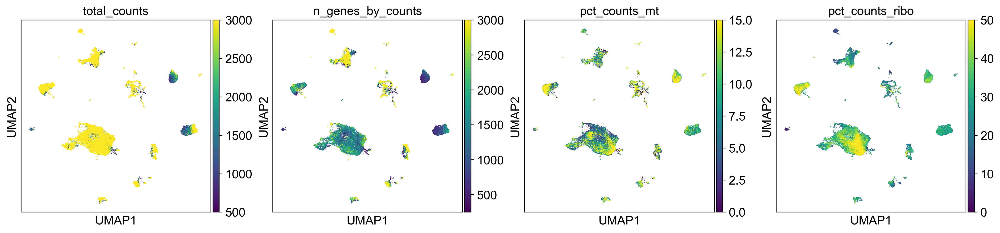

In [47]:
sc.pl.umap(adata_luad, color=['total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo'], 
          vmax = [3000, 3000, 15, 50], save = '_qc_metrics.pdf')

In [49]:
# plot marker genes in umap 
gene_list = ['PTPRC','EPCAM', 'MUC1', 'VIM','CHGA','CHGB','SYP','ASCL1','ASCL2',
             'NEUROD1','POU2F3','YAP1','HES6','HES1','REST',
             'NKX2-1','NAPSA','S100P','S100A9','TACSTD2','AGR2','WFDC2',
             'KRT7','KRT19','TP63','KRT5','KRT6A','KRT6B','KRT6C',
             'DLK2','S100B','NCAM1','VCAM1','ICAM1','ENO2','MAP2',
             'RBFOX3','SCGB1A1','SCGB3A1','MUC1','MUC5B','FOXJ1', 'VEGFA',
             'CDH5',
             # fibroblast
             'COL1A1','COL1A2', 
             # T cell
             'CD2','CD3E', #'TRAC', 'CD28', 
             'IL7R','CD4', 'CD8B', 'GZMK',
             'FOXP3',  
             # NK
             'KLRD1', 'PRF1', 'NKG7', 'KIR2DL3', 'NCR1', 'GZMH',
             # RBC
             'HBB', 'HBA2', 'HBA1',
             # general endothelial
             'CLDN5','PECAM1',
             # lymphatic endothelial
             'PDPN',
             # momacDC
             'LYZ', 'MAFB', 'CSF1R',
             'MSR1', 'CD300E', 'CD1A', 
             # pDC
             'LILRA4', 'IRF7', 'PACSIN1', 'TCF4', 'IL3RA',
             # neutrophil
             'CXCL8',  'CXCR2', 'S100A8', 'FCGR3B', 'CSF3R', 'FFAR2',
             # mast
             #'CPA3', 'GATA2', 'MS4A2', 'TPSAB1', 'HDC',
             'KIT',
             # B cell
             'MS4A1', #'BANK1', 'PAX5', 'TNFRSF13C', 'CD24', 
             'CD19', #'CR2', 
             # plasma cell
             #'IGLC2', 'IGHA1', 'IGHG3',
             'MZB1', #'SDC1', 'TNFRSF17',

             # other DC markers
             'CCR7','LAMP3','ITGAX','ITGAM',
             # general myeloid/mac
             'CD14','C1QA', 'HLA-DRB1', 'PPARG', 'MARCO', 'SPP1',
            # cytokine
             'IFNA1', #'TNF', 'IL1B'
            ]

## Phenograph clustering

In [44]:
communities, graph, Q = phenograph.cluster(adata_luad.obsm['X_pca'][:,0:50],k=40,clustering_algo='leiden',
                                           seed=0,min_cluster_size=100)
print(np.unique(communities,return_counts=True))
adata_luad.obs['Phenograph_cluster'] = ['C' + str(x) for x in communities]
adata_luad.obs['Phenograph_cluster'] = adata_luad.obs['Phenograph_cluster'].astype("category")

Finding 40 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 165.59470105171204 seconds
Jaccard graph constructed in 9.792870044708252 seconds
Running Leiden optimization
Leiden completed in 13.981773138046265 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 193.2983591556549 seconds
(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42]), array([ 135, 8704, 8399, 8332, 6598, 6236, 5608, 4738, 3044, 2964, 2273,
       2078, 1979, 1975, 1908, 1817, 1717, 1693, 1505, 1499,  893,  833,
        830,  826,  732,  712,  698,  657,  621,  589,  563,  496,  427,
        368,  359,  326,  285,  282,  260,  233,  233,  177,  154,  153]))


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Phenograph_cluster']`


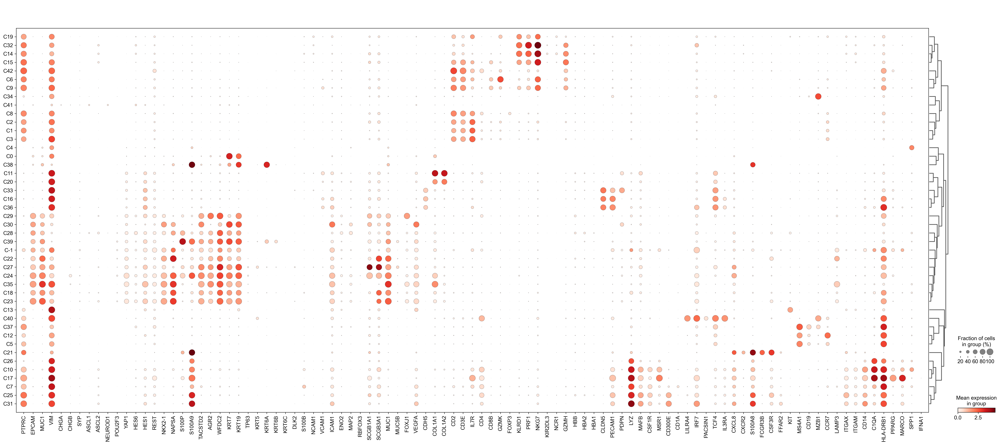

In [53]:
# plot a heatmap of these genes clustered
sc.tl.dendrogram(adata_luad, groupby = 'Phenograph_cluster', n_pcs = 50, use_raw = False, 
                cor_method= 'pearson', linkage_method= 'average')
sc.pl.dotplot(adata_luad, gene_list,dendrogram=1, groupby = 'Phenograph_cluster', use_raw = False,
              save = '_Lu_HTAN_LS_libSizeNorm_5khvg_50pc_phenoGraph_clusterExp_rmlx.pdf')

In [58]:
# how many cells in each cluster?
adata_luad.obs['Phenograph_cluster'].value_counts()

C0     8704
C1     8399
C2     8332
C3     6598
C4     6236
C5     5608
C6     4738
C7     3044
C8     2964
C9     2273
C10    2078
C11    1979
C12    1975
C13    1908
C14    1817
C15    1717
C16    1693
C17    1505
C18    1499
C19     893
C20     833
C21     830
C22     826
C23     732
C24     712
C25     698
C26     657
C27     621
C28     589
C29     563
C30     496
C31     427
C32     368
C33     359
C34     326
C35     285
C36     282
C37     260
C38     233
C39     233
C40     177
C41     154
C42     153
C-1     135
Name: Phenograph_cluster, dtype: int64

## assign clusters

In [ ]:
myeloid_clusters = ['C31', 'C25', 'C7', 'C17', 'C10', 'C26', 'C21', 'C40', 'C13']
endo_clusters = ['C33', 'C16', 'C36 ']
fib_clusters = ['C11', 'C20']
# removing C41 because this does not appear to be epithelial, if anythink it's TNK or myeloid, but doesn't fit a good pattern
epi_clusters = ['C23', 'C18', 'C35', 'C24', 'C27', 'C22', 'C39', 'C28', 'C30', 'C29', 'C38', 'C0', 'C4']
b_clusters = ['C34', 'C5', 'C12', 'C37']
tnk_clusters = ['C3', 'C1', 'C2', 'C8', 'C9', 'C6', 'C42', 'C15', 'C14', 'C32', 'C19']

## output anndatas

In [77]:
# now make adata objects with just cells from each of these subsets
# subset the results object with the different clusters
adata_fib = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(fib_clusters)].copy()
adata_endo = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(endo_clusters)].copy()
adata_myl = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(myeloid_clusters)].copy()
adata_epi = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(epi_clusters)].copy()
adata_b = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(b_clusters)].copy()
adata_tnk = adata_luad[adata_luad.obs['Phenograph_cluster'].isin(tnk_clusters)].copy()


In [79]:
# reset everything to raw counts so that I can do other stuff with it later
adata_fib = adata_fib.raw.to_adata()
adata_endo = adata_endo.raw.to_adata()
adata_myl = adata_myl.raw.to_adata()
adata_epi = adata_epi.raw.to_adata()
adata_b = adata_b.raw.to_adata()
adata_tnk = adata_tnk.raw.to_adata()

In [80]:
# write out the subsetted adata files for separate analysis
adata_outdir = '/Users/roses3/Dropbox/lung_tumor/sr/data/htan/split/'

adata_fib.write_h5ad(adata_outdir + 'mesenchymal/luad_only/' + 'ad_fib_20220504.h5ad')
adata_endo.write_h5ad(adata_outdir + 'mesenchymal/luad_only/' + 'ad_endo_20220504.h5ad')
adata_myl.write_h5ad(adata_outdir + 'myeloid/luad_only/' + 'ad_myl_20220504.h5ad')
adata_epi.write_h5ad(adata_outdir + 'epi/luad_only/' + 'ad_epi_20220504.h5ad')
adata_b.write_h5ad(adata_outdir + 'bcell/luad_only/' + 'ad_bcell_20220504.h5ad')
adata_tnk.write_h5ad(adata_outdir + 'tnk/luad_only/' + 'ad_tnk_20220504.h5ad')

### Remove low quality cells identified from other lineages

Loading low quality cells identified as a result of the other lineage processings so that they will not be included in the final global t-SNE. 

In [12]:
bad_cell_list = [pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/split/tnk/luad_only/clustering/figs/tnk_removed_cellIndex.csv", index_col=0, squeeze = True).astype('str'),
pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/split/myeloid/luad_only/clustering/figs/myeloid_removed_cellIndex.csv", index_col=0, squeeze = True).astype('str'),
pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/split/mesenchymal/luad_only/endo/clustering/figs/endo_removed_cellIndex.csv", index_col=0, squeeze = True).astype('str'),
pd.read_csv("/Users/roses3/Dropbox/lung_tumor/sr/data/htan/split/mesenchymal/luad_only/fib/clustering/figs/fib_removed_cellIndex.csv", index_col=0, squeeze = True).astype('str'), 
                # also put in the cells that are cluster C-1
                pd.Series(adata_luad.obs[adata_luad.obs['Phenograph_cluster'] == 'C-1'].index)]
rm_cell_idx = pd.concat(bad_cell_list)

## plot tsne with lineage and patient labels

Plotting the t-SNE with lineage labels. 

This is the level of granularity:
- Epithelial
- Lymphatic endothelial
- Blood endothelial
- Myeloid
- Neutrophil
- Fibroblasts
- NK/T
- B cell
- Remove low quality


Here I need to load in annotations from my lineage specific analyses so that I can remove cells that were deemed low quality in those and get their granular cell annotations as they are better. 


In [13]:
# recompute things with the bad cells filtered out
adata_luad_f = adata_luad[~adata_luad.obs.index.isin(rm_cell_idx),:].copy()

In [48]:
sc.tl.tsne(adata_luad_f, n_pcs=50  )

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:08:58)


/Users/roses3/miniconda3/envs/workshop_2023/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


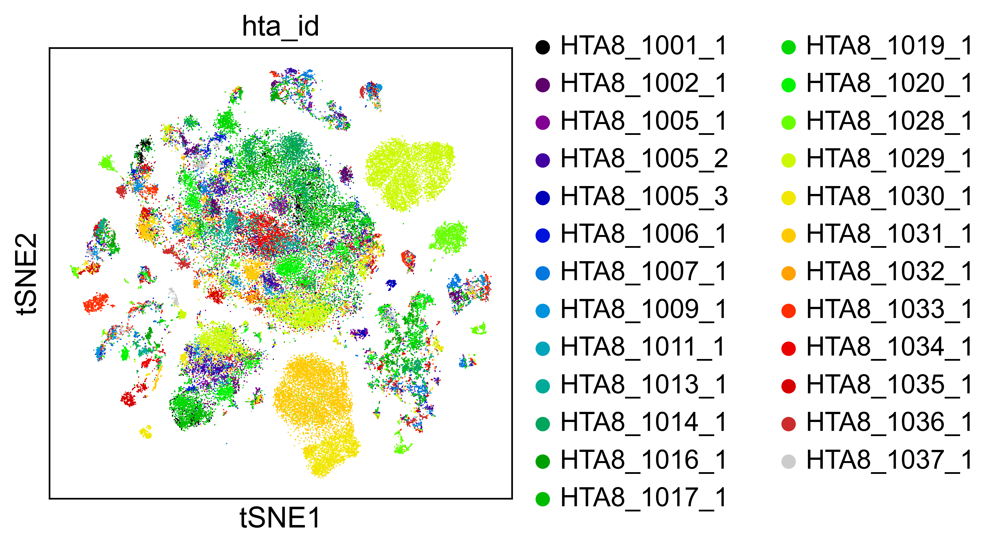

In [24]:
sc.pl.tsne(adata_luad_f, color = 'hta_id',palette='nipy_spectral', save= "_htadID_rmBadCell_p30.pdf" )

### recode cluster labels for lineage plot

Need to specify which clusters are of what lineage

In [5]:
# this is what I already have
# subset the different clusters based on their marker expression
myeloid_clusters = ['C28', 'C18', 'C9', 'C8', 'C34', 'C27', 'C23', 'C13', 'C43']
endo_clusters =  ['C35', 'C16', 'C39']
fib_clusters = ['C11', 'C22']
epi_clusters = ['C30', 'C31', 'C33', 'C32', 'C25', 'C38', 'C24', 'C20', 'C40', 'C26', 'C29', 'C10', 'C17', 'C41', 'C0', 'C4']
b_clusters =  ['C42', 'C12', 'C6', 'C37']
tnk_clusters = ['C21', 'C15', 'C14', 'C36', 'C44', 'C19', 'C3', 'C7', 'C1', 'C2', 'C5']

In [6]:
cluster_lineage_conv = pd.DataFrame({'Phenograph_cluster': myeloid_clusters + endo_clusters + fib_clusters + epi_clusters + b_clusters + tnk_clusters, 
                                     'cell_lineage': ['Myeloid'] * 6 + ['Neutrophil', 'Myeloid', 'Myeloid', 
                                                     'Lymphatic Endothelial', 'Blood Endothelial', 'Blood Endothelial', 
                                                     'Fibroblast', 'Fibroblast'] + ['Epithelial'] * 16 + ["B cell"] * 4 + ["T/NK"] * 11})

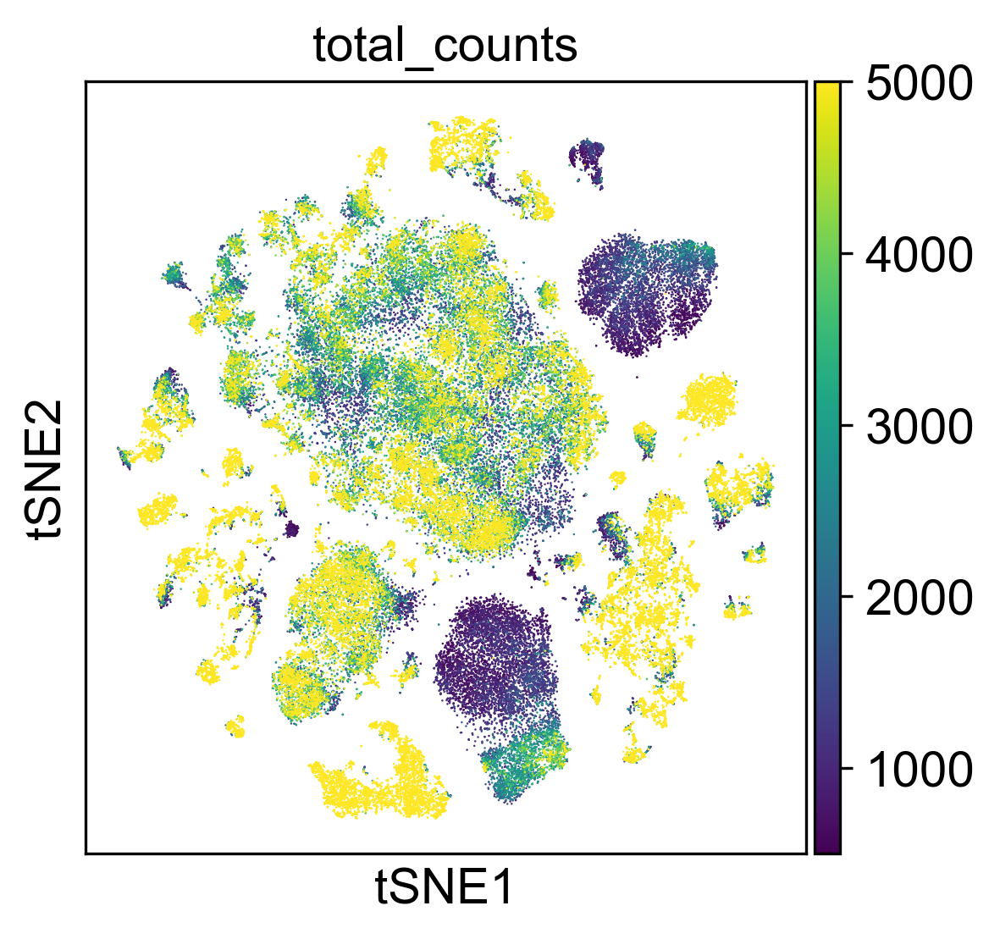

In [55]:
sc.pl.tsne(adata_luad_f, color = ['total_counts'], vmax = 5000)

... storing 'Phenograph_cluster' as categorical
... storing 'cell_lineage' as categorical


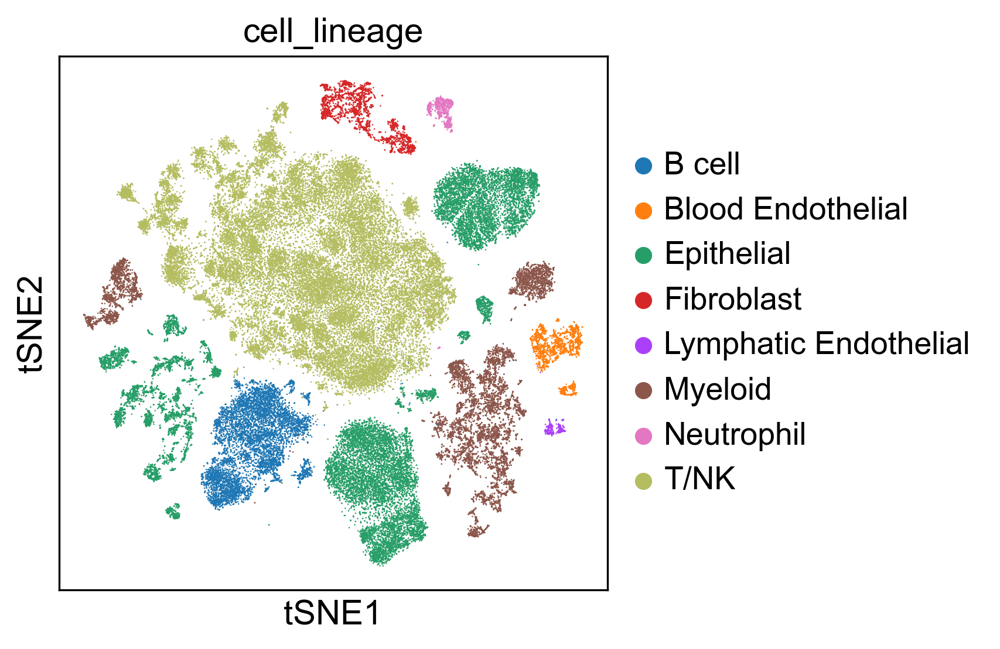

In [22]:
sc.pl.tsne(adata_luad_f, color = 'cell_lineage', save = "_lineage_rmBadCell_p30.pdf")

## heatmap of marker genes used for cell typing

I am going to use a reduced set of marker genes for the heatmap that I need to for the paper and discriminating clusters. 



In [8]:
# plot marker genes in umap 
gene_list_hmap = ['PTPRC','EPCAM', 'MUC1', 'VIM', 'NQO1',
             #'CHGA','CHGB','SYP','ASCL1','ASCL2',
             #'NEUROD1','POU2F3','YAP1','HES6','HES1','REST',
             #'NKX2-1','NAPSA','S100P','S100A9','TACSTD2','AGR2','WFDC2',
             'KRT7','KRT19','TP63','KRT5','KRT6A','KRT6B','KRT6C',
             'DLK2','S100B','NCAM1','VCAM1','ICAM1','ENO2','MAP2',
             #'RBFOX3','SCGB1A1','SCGB3A1','MUC1','MUC5B','FOXJ1', 'VEGFA',
             #'CDH5',
             # fibroblast
             'COL1A1','COL1A2', 
             # T cell
             'CD3E', 'TRAC', 'CD28', 
             'IL7R','CD4', 'CD8B', 
             'FOXP3',  
             # NK
             'KLRD1', 'PRF1', 'NKG7',  'NCR1', 
             # RBC
             #'HBB', 'HBA2', 'HBA1',
             # general endothelial
             'CLDN5','PECAM1',
             # lymphatic endothelial
             'PDPN',
             # momacDC
             'LYZ', 'MAFB', 'CSF1R',
             #'MSR1', 'CD300E', 'CD1A', 
             'CD14', 'HLA-DRB1', 
             #'PPARG', 'MARCO', 'SPP1',
             # pDC
             'LILRA4', 'IRF7', 
                  #'PACSIN1', 
                  'TCF4', 
                # other DC markers
             'CCR7','ITGAX','ITGAM',
             # neutrophil
             'CXCL8',  'CXCR2', 'S100A8', 'FCGR3B', 'CSF3R', 
             # mast
             'CPA3', 
             #'GATA2', 'MS4A2', 'TPSAB1', 'HDC',
             'KIT',
             # B cell
             'MS4A1', #'BANK1', 'PAX5', 'TNFRSF13C', 'CD24', 
             'CD19', #'CR2', 
             # plasma cell
             #'IGLC2', 'IGHA1', 'IGHG3',
             'MZB1', #'SDC1', 'TNFRSF17',
            ]

In [9]:
# define colors for clusters
row_clusters = np.array(cols_use)[pd.factorize(cluster_lineage_conv['cell_lineage'])[0].astype(int)]

In [10]:
# change back to gene names
adata_luad_f.var_names = adata_luad_f.var.gene_name

In [11]:
#endo_genes_undict = [j for k in ENDOMARKERS_dict.values() for j in k]
lin_genes = [adata_luad_f.var_names.get_loc(j) for j in gene_list_hmap]
sub_data = pd.DataFrame(adata_luad_f.X[:, lin_genes].todense().copy(), 
                             columns = gene_list_hmap)
sub_data['Cluster'] = adata_luad_f.obs['Phenograph_cluster'].values

In [12]:
# average expression
sub_data_avg = sub_data.groupby('Cluster').mean()

In [13]:
cluster_lineage_conv_f = cluster_lineage_conv[cluster_lineage_conv['Phenograph_cluster'] != 'C17']

In [14]:
# correct the positioning
sub_data_avg = sub_data_avg.loc[cluster_lineage_conv_f['Phenograph_cluster']]


In [16]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams["font.family"] = 'sans serif'

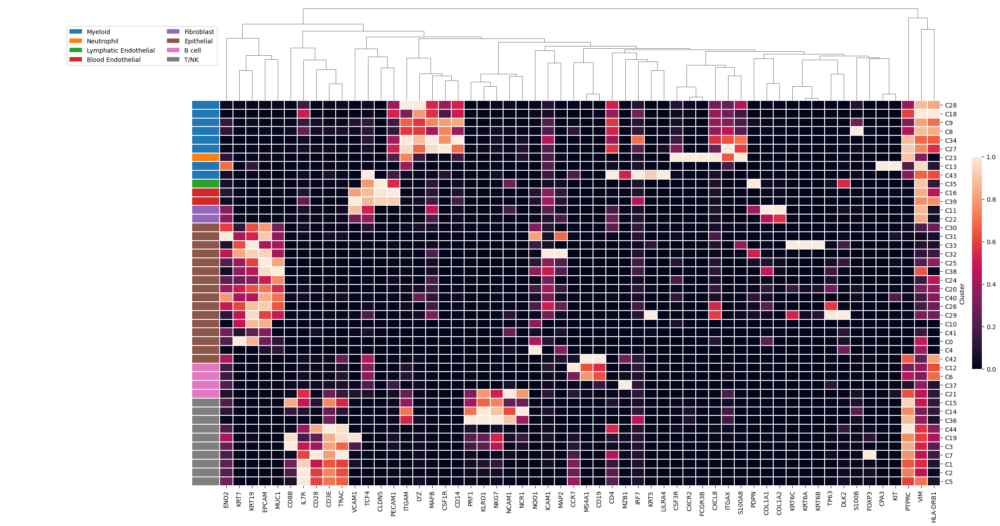

In [17]:
g = sns.clustermap(sub_data_avg, standard_scale = 1, row_colors = row_clusters, 
                   row_cluster = False,
                   col_cluster = True, figsize = (22, 12), linewidth = 0.2, 
                   cbar_pos=(1, .3, .01, .4) )

# Draw the legend bar for the classes                 
for ct, label in enumerate([j for j in cluster_lineage_conv['cell_lineage'].unique()]):
    g.ax_col_dendrogram.bar(0, 0, color=cols_use[ct],
                            label=label, linewidth=0)
g.ax_col_dendrogram.legend(ncol=2, bbox_to_anchor = (0, 0.8))
#mpl.savefig(figure_dir + "human_LUAD_lineage_heatmap.pdf")
g.savefig(figure_dir + "human_LUAD_lineage_heatmap.pdf")